In [1]:
from pysal.lib import weights
from pysal.explore import esda
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn
import contextily

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/sarahamundrud/opt/anaconda3/envs/geospatial_ds/lib/python3.10/site-packages/spaghetti/network.py:40: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)


# 1. Data Setup

In [2]:
# Reading in the data
path = '../Data/Data_pt1/'

# REMINDER - The listings data must be downloaded from Inside Airbnb
listings = pd.read_csv(path + 'NY_Airbnb_Oct_2023/listings.csv.gz', compression='gzip', low_memory=False)

# Converting it to a GeoPandas DataFrame
listings_gpdf = gpd.GeoDataFrame(
    listings,
    geometry=gpd.points_from_xy(listings['longitude'],
                                   listings['latitude'],
                                   crs="EPSG:4326")
)

# Focusing on attractions in Manhattan, so we need to create a mask to filter locations 
# in the Manhattan borough
boroughs = gpd.read_file(path + "NYC Boroughs/nybb_22a/nybb.shp")
manhattan = boroughs[boroughs['BoroName']=='Manhattan']
manhattan = manhattan.to_crs('EPSG:4326')

listings_mask = listings_gpdf.within(manhattan.loc[3, 'geometry'])

listings_manhattan = listings_gpdf.loc[listings_mask]

In [3]:
print(list(listings_manhattan.columns))

['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availabil

In [4]:
# Subsetting the data to a handful of variables that could be indicative of nightly airbnb price
voi = ['id' # Unique identifier for the listing
       ,'room_type' # Type of room
       ,'accommodates' # The maximum capacity of the listing 
       ,'bedrooms' # The number of bedrooms
       ,'beds' # The number of beds
       ,'review_scores_rating' # The rating
       ,'price' # The nightly rental rate, dependent variable (Y)
      ]

listings_manhattan_subset = listings_manhattan[voi]

In [5]:
listings_manhattan_subset

,id,room_type,accommodates,bedrooms,beds,review_scores_rating,price
1,3533741,Private room,2,1.0,1.0,NaN,$110.00
5,53903662,Private room,1,NaN,1.0,4.43,$140.00
6,53722728,Private room,1,NaN,1.0,4.29,$125.00
8,3539618,Entire home/apt,2,NaN,1.0,4.67,$170.00
10,675959117355164668,Private room,1,NaN,1.0,NaN,$137.00
...,...,...,...,...,...,...,...
38783,736191441598456999,Private room,1,NaN,1.0,NaN,$48.00
38785,148825,Entire home/apt,3,2.0,2.0,4.75,$193.00
38786,465706,Entire home/apt,2,1.0,1.0,4.67,$103.00
38788,11871903,Private room,2,NaN,1.0,5.00,$75.00


## 1.1 Exploratory Data Analysis & Processing

In [6]:
listings_manhattan_subset.dtypes

id                        int64
room_type                object
accommodates              int64
bedrooms                float64
beds                    float64
review_scores_rating    float64
price                    object
dtype: object

In [7]:
for col in listings_manhattan[['room_type']]:
  print(listings_manhattan_subset[col].unique())

['Private room' 'Entire home/apt' 'Shared room' 'Hotel room']


In [8]:
# Encoding categorical variables

# Room Type, All 0s = hotel room
listings_manhattan_subset['rt_entire_home_apartment'] = np.where(listings_manhattan_subset["room_type"]=='Entire home/apt', 1, 0)
listings_manhattan_subset['rt_private_room'] = np.where(listings_manhattan_subset["room_type"]=='Private room', 1, 0)
listings_manhattan_subset['rt_shared_room'] = np.where(listings_manhattan_subset["room_type"]=='Shared room', 1, 0)

/var/folders/b2/d7c60fp557555jg6jbxm1f4r0000gn/T/ipykernel_5758/4113258551.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_manhattan_subset['rt_entire_home_apartment'] = np.where(listings_manhattan_subset["room_type"]=='Entire home/apt', 1, 0)
/var/folders/b2/d7c60fp557555jg6jbxm1f4r0000gn/T/ipykernel_5758/4113258551.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_manhattan_subset['rt_private_room'] = np.where(listings_manhattan_subset["room_type"]=='Private room', 1, 0)
/var/folde

In [9]:
listings_manhattan_subset['price'].values

array(['$110.00', '$140.00', '$125.00', ..., '$103.00', '$75.00',
       '$85.00'], dtype=object)

In [10]:
# Cleaning up the price column
listings_manhattan_subset['price'] = listings_manhattan_subset['price'].str.replace('$', '')
listings_manhattan_subset['price'] = listings_manhattan_subset['price'].str.replace(',', '')
listings_manhattan_subset['price'] = listings_manhattan_subset['price'].astype(float)

# Logging the price variable
listings_manhattan_subset['log_price'] = np.log(listings_manhattan_subset['price'])

/var/folders/b2/d7c60fp557555jg6jbxm1f4r0000gn/T/ipykernel_5758/714595755.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_manhattan_subset['price'] = listings_manhattan_subset['price'].str.replace('$', '')
/var/folders/b2/d7c60fp557555jg6jbxm1f4r0000gn/T/ipykernel_5758/714595755.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_manhattan_subset['price'] = listings_manhattan_subset['price'].str.replace(',', '')
/var/folders/b2/d7c60fp557555jg6jbxm1f4r0000gn/T/ipykernel_5758/714595755.

In [11]:
# Checking for missingness
print('Total Records:', len(listings_manhattan_subset))
listings_manhattan_subset.isna().sum()

Total Records: 16904


id                             0
room_type                      0
accommodates                   0
bedrooms                    6166
beds                         232
review_scores_rating        5594
price                          0
rt_entire_home_apartment       0
rt_private_room                0
rt_shared_room                 0
log_price                      0
dtype: int64

In [12]:
listings_manhattan_subset = listings_manhattan_subset[listings_manhattan_subset['bedrooms'].notna()]
listings_manhattan_subset = listings_manhattan_subset[listings_manhattan_subset['review_scores_rating'].notna()]
listings_manhattan_subset = listings_manhattan_subset[listings_manhattan_subset['beds'].notna()]
listings_manhattan_subset.isna().sum()

id                          0
room_type                   0
accommodates                0
bedrooms                    0
beds                        0
review_scores_rating        0
price                       0
rt_entire_home_apartment    0
rt_private_room             0
rt_shared_room              0
log_price                   0
dtype: int64

# 2. OLS Regression Analysis

In [13]:
from pysal.model import spreg

In [14]:
# Defining a list of explanatory variables
m_vars = ['accommodates', 'bedrooms','beds','review_scores_rating',
          'rt_entire_home_apartment','rt_private_room','rt_shared_room'
         ]

In [15]:
ols_m = spreg.OLS(
    listings_manhattan_subset[["log_price"]].values # the dependent variable (Y)
    ,listings_manhattan_subset[m_vars].values # the independent variables(Xs)
    ,name_y = 'price',
    name_x = m_vars
)

print(ols_m.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :       price                Number of Observations:        6690
Mean dependent var  :      5.4212                Number of Variables   :           7
S.D. dependent var  :      0.6844                Degrees of Freedom    :        6683
R-squared           :      0.2467
Adjusted R-squared  :      0.2460
Sum squared residual:     2360.25                F-statistic           :    364.7045
Sigma-square        :       0.353                Prob(F-statistic)     :           0
S.E. of regression  :       0.594                Log likelihood        :   -6007.718
Sigma-square ML     :       0.353                Akaike info criterion :   12029.436
S.E of regression ML:      0.5940                Schwarz criterion     :   12077.095

------------------------------------------------------------

## 2.1 Exploring unmodeled relationships

In [16]:
# Creating a column to store the model residuals
listings_manhattan_subset["ols_m_r"] = ols_m.u

# Bringing back in the neighborhood variable
listings_manhattan_subset = listings_manhattan_subset.merge(listings_manhattan[['id','neighbourhood_cleansed']], how='left',on='id')

# Get average value of the residual by neighborhood
mean = (
    listings_manhattan_subset.groupby("neighbourhood_cleansed")
    .ols_m_r.mean()
    .to_frame("neighborhood_residual")
)

# Creating a dataframe to store the residuals by neighborhood
residuals_neighborhood = listings_manhattan_subset.merge(
        mean, how="left", left_on="neighbourhood_cleansed", right_index=True
    ).sort_values("neighborhood_residual")

In [17]:
import plotly.express as px
import plotly.io as pio
from IPython.display import HTML

# Plotting the distribution of the residuals in a violin plot
fig = px.violin(residuals_neighborhood, x="neighbourhood_cleansed", y="ols_m_r", color="neighbourhood_cleansed", box=True)
# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Neighborhood", yaxis_title="Residuals"
)
HTML(fig.to_html())

In [18]:
import textwrap

In [19]:
contextily.providers.AzureMaps.MicrosoftBaseRoad

{'url': 'https://atlas.microsoft.com/map/tile?api-version={apiVersion}&tilesetId={variant}&x={x}&y={y}&zoom={z}&language={language}&subscription-key={subscriptionKey}',
 'html_attribution': 'See https://docs.microsoft.com/en-us/rest/api/maps/render-v2/get-map-tile for details.',
 'attribution': 'See https://docs.microsoft.com/en-us/rest/api/maps/render-v2/get-map-tile for details.',
 'apiVersion': '2.0',
 'variant': 'microsoft.base.road',
 'subscriptionKey': '<insert your subscription key here>',
 'language': 'en-US',
 'name': 'AzureMaps.MicrosoftBaseRoad'}

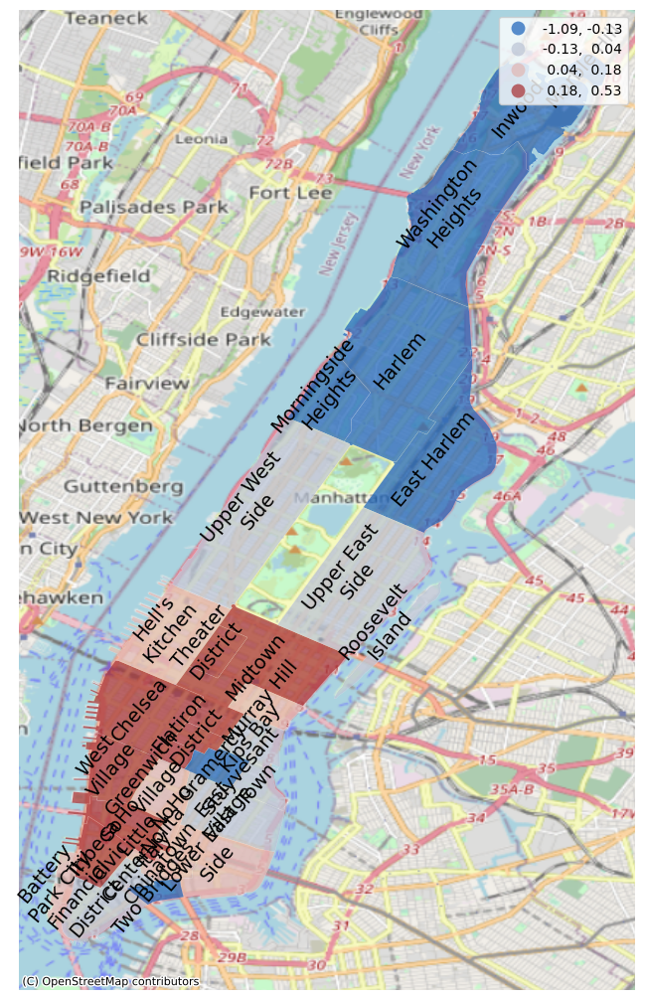

In [20]:
# Producing a map of the average residual by neighborhood
import requests
import geopandas as gpd
from shapely.geometry import shape

# Reading in the NYC Neighborhoods shapefile from data file
import os

nyc_n = gpd.read_file(os.path.join(path,"NYC Neighborhoods/NYC_Neighborhoods.geojson"), driver='GeoJSON')

# Merging
nyc_n_r = nyc_n.merge(mean, left_on='neighborhood', right_on="neighbourhood_cleansed")

f, ax = plt.subplots(1, figsize=(8, 15))
   
# Plot choropleth of local statistics
nyc_n_r.plot(
    column='neighborhood_residual', 
    cmap='vlag', 
    scheme='quantiles',
    k=4, 
    edgecolor='white', 
    linewidth=0.1, 
    alpha=0.75,
    legend=True,
    ax=ax
)

# Add basemap
contextily.add_basemap(
    ax,
    crs=nyc_n.crs,
    #source=contextily.providers.Stamen.Watercolor,
    source=contextily.providers.OpenStreetMap.Mapnik
)

for idx, row in nyc_n_r.iterrows():
    txt=row['neighborhood']
    n_txt = '\n'.join(textwrap.wrap(txt, width=11, replace_whitespace=True))
    #print(n_txt)                  
    plt.annotate(text=n_txt, xy=tuple([row.geometry.centroid.x, row.geometry.centroid.y]),
                 horizontalalignment='center',fontsize=14, rotation=50, wrap=True)

    
# Remove axis
ax.set_axis_off()

# Display
plt.show()
#f.savefig(r"G:\My Drive\Geospatial Data Science with Python\Neighborhood Residuals.png")

/Users/sarahamundrud/opt/anaconda3/envs/geospatial_ds/lib/python3.10/site-packages/libpysal/weights/weights.py:224: UserWarning:

The weights matrix is not fully connected: 
 There are 5 disconnected components.



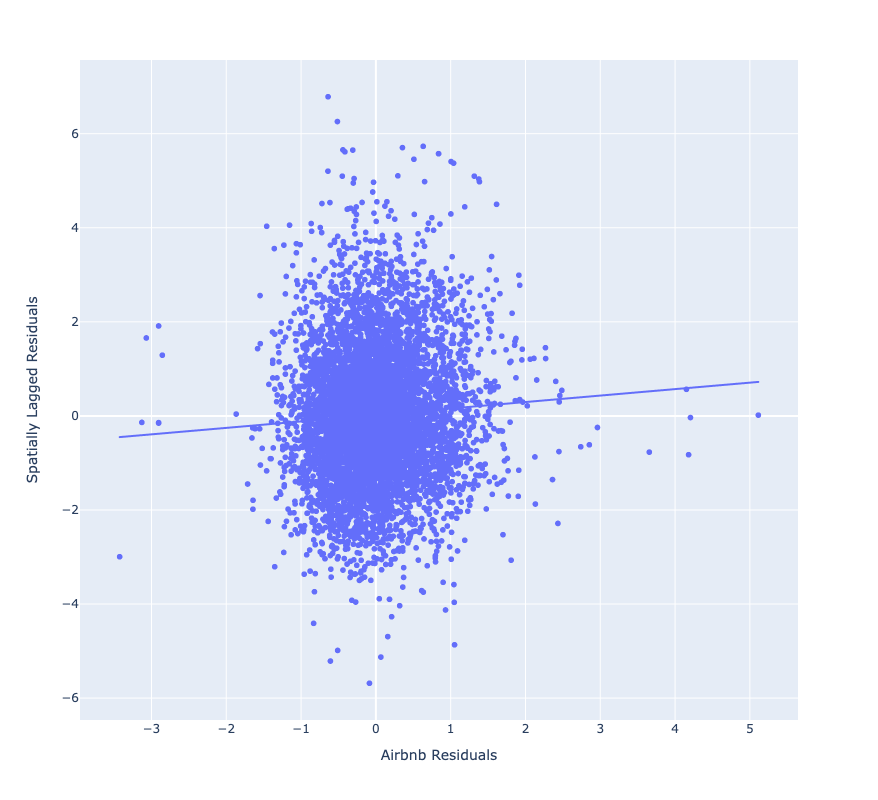

In [21]:
# Bringing in the geometry attribute
residuals_neighborhood = residuals_neighborhood.merge(listings_manhattan[['id','geometry']], how='left',on='id')

# Building the spatial weights matrix
knn = weights.KNN.from_dataframe(residuals_neighborhood, k=5)

# Constructing the spatial lag
lag_residual = weights.spatial_lag.lag_spatial(knn, ols_m.u)

# Plotting the results
fig = px.scatter(x=ols_m.u.flatten(), y=lag_residual.flatten(), trendline="ols",
                width=800, height=800)

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals", yaxis_title="Spatially Lagged Residuals"
)

fig.show()


# 3. OLS Regression Analysis w/ Spatial Atributes

## 3.1 Spatial Feature Engineering

In [22]:
# Reading in data on popular NYC Attractions
nyc_attr = pd.read_csv('../Data/NYC_Attractions/NYC Attractions.csv')

# Convert PDF to GPDF
nyc_attr_gpdf =  gpd.GeoDataFrame(
    nyc_attr,
    geometry=gpd.points_from_xy(nyc_attr['Longitude'],
                                   nyc_attr['Latitude'],
                                   crs="EPSG:4326")
)

# Calculate the distance to each attraction per airbnb
attractions = nyc_attr_gpdf.Attraction.unique()

# Converting to a projected coordinate system
nyc_attr_gpdf_p = nyc_attr_gpdf.to_crs('EPSG:2263')
listings_manhattan_p = listings_manhattan.to_crs('EPSG:2263')

# Applying a lambda function that calls geopandas distance function to calcuate the distance between each airbnb and each attraction
distances = listings_manhattan_p.geometry.apply(lambda g: nyc_attr_gpdf_p.distance(g))

# Renaming the columns based on the attraction for which the distance is calculated
distances.columns = attractions

# Convert from 'US survey foot' to miles
distances = distances.apply(lambda x: x/5280, axis=1)

# Check to see which locations are less than 1 to 6 miles
distances_1mi = distances.apply(lambda x: x <=1, axis=1).sum(axis=1)
distances_2mi = distances.apply(lambda x: x <=2, axis=1).sum(axis=1)
distances_3mi = distances.apply(lambda x: x <=3, axis=1).sum(axis=1)
distances_4mi = distances.apply(lambda x: x <=4, axis=1).sum(axis=1)
distances_5mi = distances.apply(lambda x: x <=5, axis=1).sum(axis=1)
distances_6mi = distances.apply(lambda x: x <=6, axis=1).sum(axis=1)

# Creating a dataframe combining all the distance bands
distance_df = pd.concat([distances_1mi,distances_2mi,distances_3mi,distances_4mi,distances_5mi,distances_6mi], axis=1)
distance_df.columns = ['Attr_1mi','Attr_2mi','Attr_3mi','Attr_4mi','Attr_5mi','Attr_6mi']

# Joining back to the listings geopandas df
listings_manhattan = listings_manhattan.merge(distances, left_index=True, right_index=True)
listings_manhattan = listings_manhattan.merge(distance_df, left_index=True, right_index=True)

## 3.2 Modeling with Proximity Features

In [23]:
# Geographic Features
g_vars = ['Central Park', 'Central Park Zoo', 'Empire State Building', 'Statue of Liberty', 
          'Rockeffeller Center', 'Chrysler Building', 'Times Square', 'MoMa', 'Charging Bull']

# Bring the geographic features into our subset
listings_manhattan_subset = listings_manhattan_subset.merge(listings_manhattan[['id','Central Park', 'Central Park Zoo', 'Empire State Building', 'Statue of Liberty', 
          'Rockeffeller Center', 'Chrysler Building', 'Times Square', 'MoMa', 'Charging Bull']], how='left',on='id')

# Adding geographic features to model variables used previously
g_m_vars = m_vars + g_vars



#REMOVEING SHARED ROOMS, AS THEY ARE PERFECTLY CORRELATED WITH PRIVATE ROOM AND THIS CAUSES PROBLEMS LATER
g_m_vars.remove('rt_shared_room')
g_m_vars

['accommodates',
 'bedrooms',
 'beds',
 'review_scores_rating',
 'rt_entire_home_apartment',
 'rt_private_room',
 'Central Park',
 'Central Park Zoo',
 'Empire State Building',
 'Statue of Liberty',
 'Rockeffeller Center',
 'Chrysler Building',
 'Times Square',
 'MoMa',
 'Charging Bull']

In [24]:
ols_m_g = spreg.OLS(
    listings_manhattan_subset[["log_price"]].values,
    listings_manhattan_subset[g_m_vars].values,
    name_y = 'price',
    name_x = g_m_vars
)

print(ols_m_g.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :       price                Number of Observations:        6690
Mean dependent var  :      5.4212                Number of Variables   :          16
S.D. dependent var  :      0.6844                Degrees of Freedom    :        6674
R-squared           :      0.3746
Adjusted R-squared  :      0.3731
Sum squared residual:     1959.57                F-statistic           :    266.4520
Sigma-square        :       0.294                Prob(F-statistic)     :           0
S.E. of regression  :       0.542                Log likelihood        :   -5385.402
Sigma-square ML     :       0.293                Akaike info criterion :   10802.805
S.E of regression ML:      0.5412                Schwarz criterion     :   10911.739

------------------------------------------------------------

In [25]:
model_diagnostics = pd.DataFrame(
    [[ols_m.r2, ols_m.ar2], [ols_m_g.r2, ols_m_g.ar2]],
    index=["OLS_M", "OLS_M_G"],
    columns=["R2", "Adj. R2"],
)

model_diagnostics

,R2,Adj. R2
OLS_M,0.246666,0.245989
OLS_M_G,0.374554,0.373148


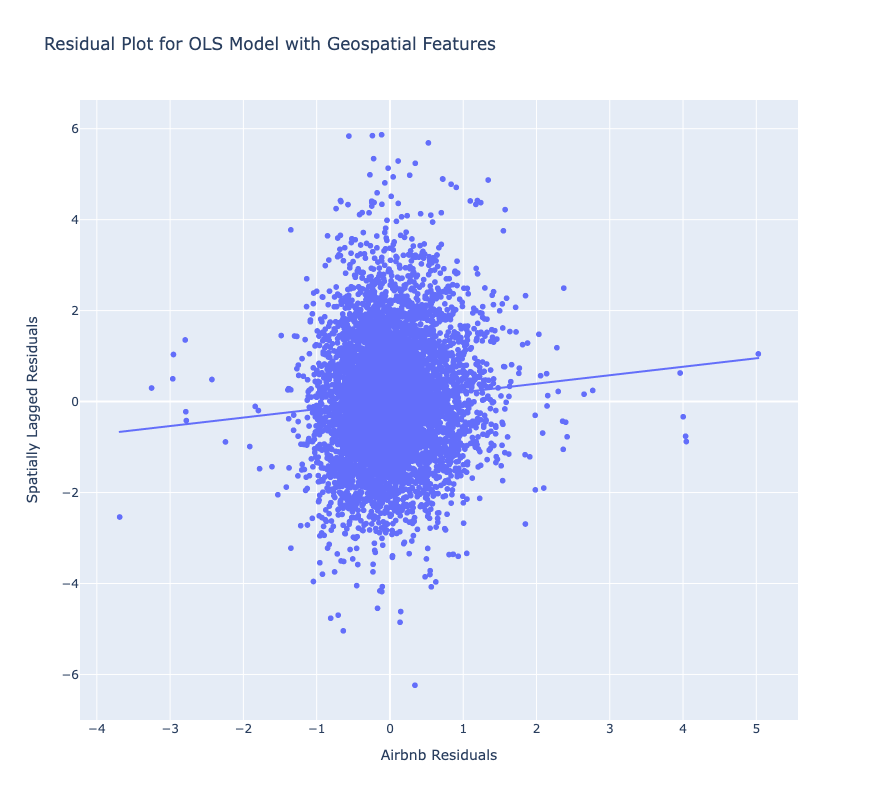

In [26]:
# Constructing the spatial lag
lag_residual_2 = weights.spatial_lag.lag_spatial(knn, ols_m_g.u)

# Plotting the results
fig = px.scatter(x=ols_m_g.u.flatten(), y=lag_residual_2.flatten(), trendline="ols",
                width=800, height=800, title="Residual Plot for OLS Model with Geospatial Features")

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals", yaxis_title="Spatially Lagged Residuals"
)

fig.show()

## 3.3 Spatial Fixed Effects Model

In [27]:
# Bringing back in the neighbourhood_cleansed variable
#listings_manhattan_subset = listings_manhattan_subset.merge(listings_manhattan[['id','neighbourhood_cleansed']], how='left',on='id')
## BUG ALERT ABOVE


# spatial fixed effect model implementation
sfe_m = spreg.OLS_Regimes(
    #The dependent variable (Y) - Log Price (log_price)
    listings_manhattan_subset[["log_price"]].values,
    
    # The independent variables (Xs)
    listings_manhattan_subset[g_m_vars].values,
    
    # Variable which specifies which neighborhood each airbnb falls within
    listings_manhattan_subset["neighbourhood_cleansed"].tolist(),
    
    # Vary constant by each cross-section/group
    constant_regi="many",
    
    # Here we tell the model that the variables are kept constant by group
    cols2regi=[False] * len(g_m_vars),
    
    # Here we tell the model to estimate a single sigma coefficient
    regime_err_sep=False,
    
    # Dependent variable name
    name_y="log_price",
    
    # Independent variables names
    name_x=g_m_vars,
)
# printing the model summary
print(sfe_m.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES - REGIMES
---------------------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:        6690
Mean dependent var  :      5.4212                Number of Variables   :          47
S.D. dependent var  :      0.6844                Degrees of Freedom    :        6643
R-squared           :      0.3895
Adjusted R-squared  :      0.3853
Sum squared residual:     1912.59                F-statistic           :     92.1541
Sigma-square        :       0.288                Prob(F-statistic)     :           0
S.E. of regression  :       0.537                Log likelihood        :   -5304.236
Sigma-square ML     :       0.286                Akaike info criterion :   10702.472
S.E of regression ML:      0.5347                Schwarz criterion     :   11022.465

----------------------------------------

In [28]:
# Print Chow Statistic 
sfe_m.chow.joint

(163.16377697447052, 7.020191827297806e-20)

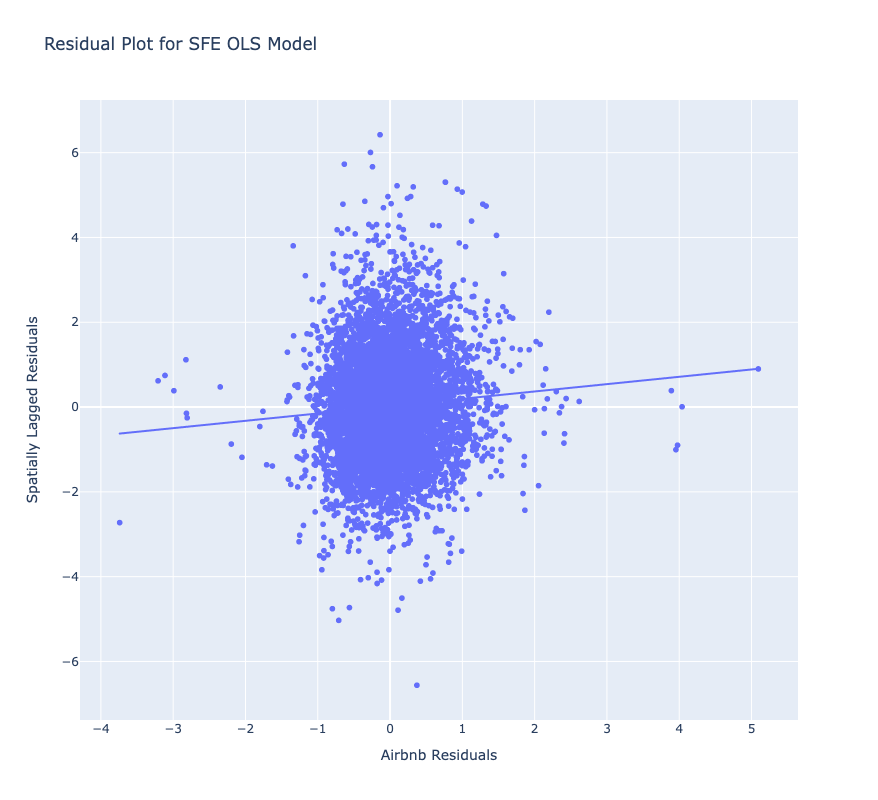

In [29]:
# Constructing the spatial lag
lag_residual_3 = weights.spatial_lag.lag_spatial(knn, sfe_m.u)

# Plotting the results
fig = px.scatter(x=sfe_m.u.flatten(), y=lag_residual_3.flatten(), trendline="ols",
                width=800, height=800, title="Residual Plot for SFE OLS Model")

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals", yaxis_title="Spatially Lagged Residuals"
)

fig.show()

## 4.0 Geographically Weighted Regression

In [30]:
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW

In [31]:
# Encoding categorical variables

# Room Type, All 0s = hotel room
listings_manhattan['rt_entire_home_apartment'] = np.where(listings_manhattan["room_type"]=='Entire home/apt', 1, 0)
listings_manhattan['rt_private_room'] = np.where(listings_manhattan["room_type"]=='Private room', 1, 0)
listings_manhattan['rt_shared_room'] = np.where(listings_manhattan["room_type"]=='Shared room', 1, 0)

# Cleaning up the price column
listings_manhattan['price'] = listings_manhattan['price'].str.replace('$', '')
listings_manhattan['price'] = listings_manhattan['price'].str.replace(',', '')
listings_manhattan['price'] = listings_manhattan['price'].astype(float)

# Logging the price variable
listings_manhattan['log_price'] = np.log(listings_manhattan['price'])

listings_manhattan = listings_manhattan[listings_manhattan['bedrooms'].notna()]
listings_manhattan = listings_manhattan[listings_manhattan['review_scores_rating'].notna()]
listings_manhattan = listings_manhattan[listings_manhattan['beds'].notna()]
listings_manhattan.isna().sum()

listings_manhattan = listings_manhattan[listings_manhattan['bedrooms'].notna()]
listings_manhattan = listings_manhattan[listings_manhattan['review_scores_rating'].notna()]
listings_manhattan = listings_manhattan[listings_manhattan['beds'].notna()]

In [32]:
# Setting the explanatory variables
exp_vars = listings_manhattan[['accommodates', 'bedrooms','beds','review_scores_rating']].values

# Setting the dependent variable: log_price
y = (listings_manhattan['log_price'].values).reshape((-1,1))

# Defining the coordinates of the observations
coords = list(zip(listings_manhattan.geometry.x,listings_manhattan.geometry.y))

In [33]:
# Selecting the optimal bandwidth for the explanatory variables
gwr_selector = Sel_BW(coords, y, exp_vars, spherical=True)
gwr_bw = gwr_selector.search(bw_min=2)

# Displaying the optimal bandwidth
gwr_bw

124.0

In [34]:
# Fit the GWR model to your data
gwr_results = GWR(coords, listings_manhattan[["log_price"]].values, 
                     exp_vars, gwr_bw).fit()

# Print the results of the GWR model
print(gwr_results)

In [35]:
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                6690
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           2441.299
Log-likelihood:                                                   -6120.659
AIC:                                                              12251.318
AICc:                                                             12253.331
BIC:                                                             -56442.649
R2:                                                                   0.221
Adj. R2:                                                              0.220

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [36]:
residuals = gwr_results.resid_response

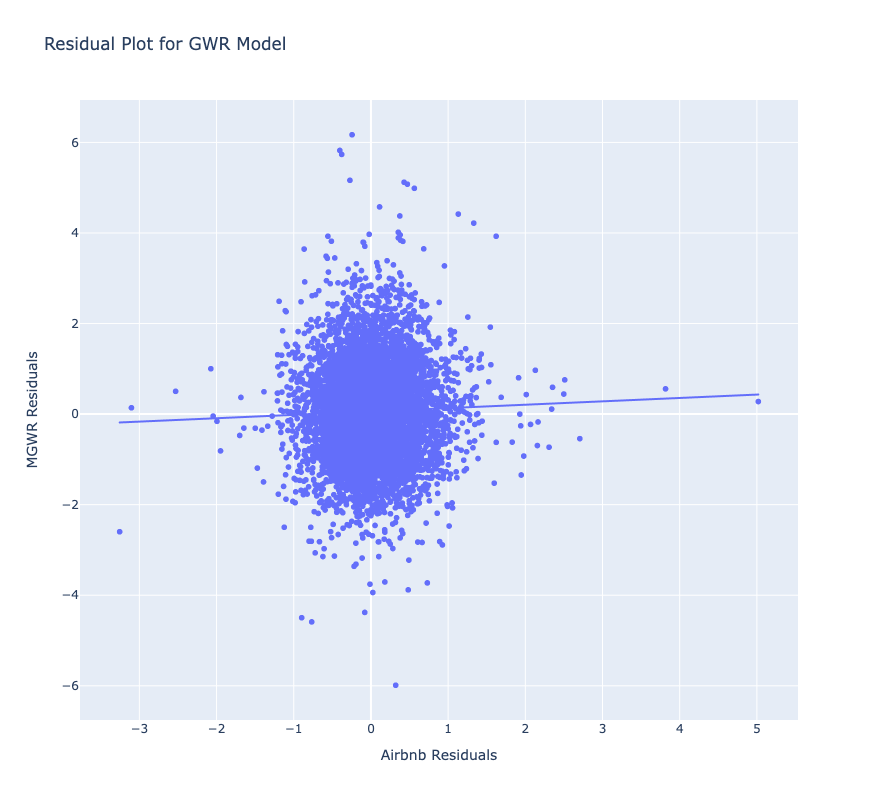

In [37]:
# Constructing the spatial lag
lag_residual_4 = weights.spatial_lag.lag_spatial(knn, residuals)

# Plotting the results
fig = px.scatter(x=residuals.flatten(), y=lag_residual_4.flatten(), trendline="ols",
                width=800, height=800, title="Residual Plot for GWR Model")

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals", yaxis_title="MGWR Residuals"
)

fig.show()

## 4.1 Multi-scale Geographically Weighted Regression

In [38]:
from mgwr.gwr import MGWR

In [39]:
listings_manhattan_sample = listings_manhattan.copy()

In [40]:
exp_vars = listings_manhattan_sample[['accommodates', 'bedrooms','review_scores_rating']].values
y = (listings_manhattan_sample['price'].values).reshape((-1,1))
coords = list(zip(listings_manhattan_sample.geometry.x,listings_manhattan_sample.geometry.y))

In [41]:
# Standardizing
exp_vars = (exp_vars - exp_vars.mean(axis=0)) / exp_vars.std(axis=0)
y = (y - y.mean(axis=0)) / y.std(axis=0)

In [42]:
selector = Sel_BW(coords, y, exp_vars, multi=True, spherical=True)
selector.search(multi_bw_min=[4])

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
# Fit the GWR model to your data
mgwr_results = MGWR(coords, y, exp_vars, selector, sigma2_v1=True).fit()

# Print the results of the GWR model
print(mgwr_results)

mgwr_results.summary()